In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# End-to-End Multi-Class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifer using Tensorflow 2.0 and Tensorflow Hub

## 1. Problem
Idenifying the breed of the dog given an image of a dog.

## 2. Data
The data we're using is from kaggle's dog breed identification competition.

## 3. Evaluation
The  evaluation is a file with prediction probabilities for each dog  breed of each test image.

## 4. Features

Some info about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/ transfer learning.

* There are 120 breeds of dogs (this means there are 120 different classes).

* There are around 10k+ images in the training test (these images have labels)

* There are around 10k+ images in the tese set (these images have no labels, because we'll predict them).


In [ ]:
# Unzip the data uploaded in G-Drive
## !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

In [ ]:
# Unzip the data uploaded in G-Drive
## !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

## Getting our workspace ready

* Import Tensorflow
* Import Tensorflow Hub
* Make sure we're using a GPU



In [ ]:
# Importing necessary tools
import tensorflow as tf
print("TF version:",tf.__version__)
import tensorflow_hub as hub
print("TF Hub version:",hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.15.0
TF Hub version: 0.16.1
GPU available (YESSSS!!!!)


## Getting our Data Ready

With all ML models, our data has to be in numerical, so turning our images into Tensors (Numerical Representation)

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data

import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

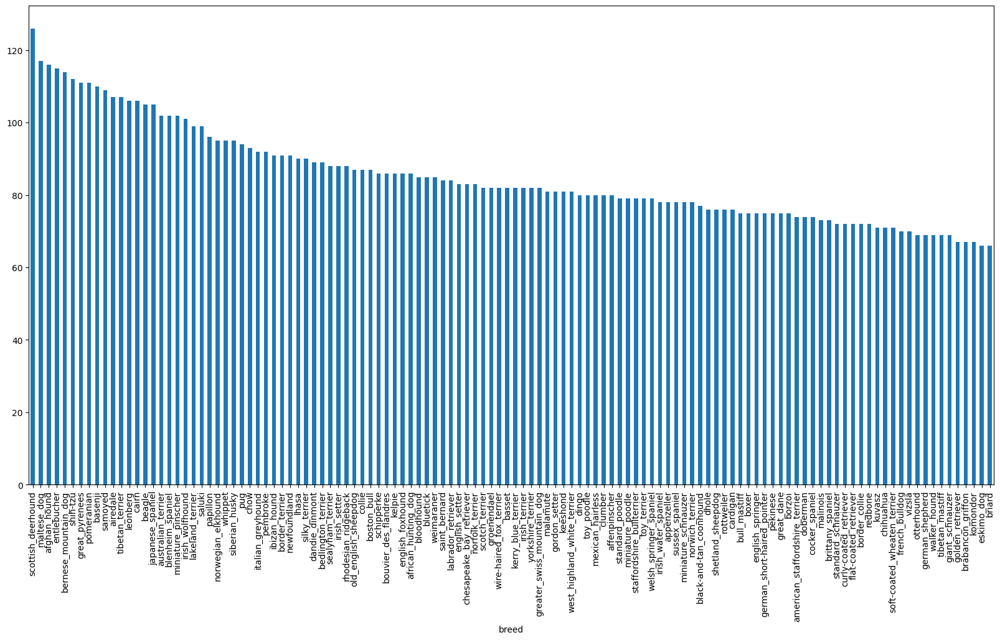

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

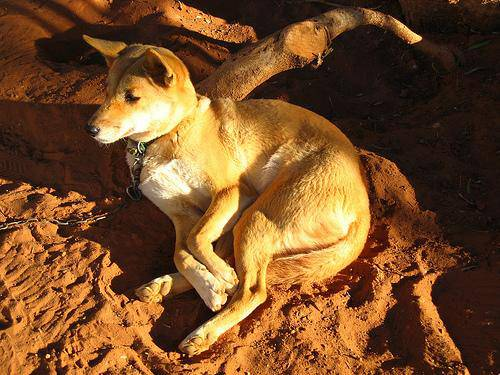

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their Labels
  Let's get a list of all our image file pathnames
  

In [ ]:
# Create pathnames from image ID's

filenames = ["drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("drive/MyDrive/Dog Vision/train")[:10]

['e67eb5ae1ff58374b0e07398d5a0da5a.jpg',
 'dd694fe7f5b46a6dd7c545d31004e1f6.jpg',
 'de41f775f1b52a040d0965e0923bc983.jpg',
 'e0629e36f6f2f4708db4b4d68bf1a75e.jpg',
 'e09cf0d6051273932911650565c30e0f.jpg',
 'dd79ba1404da7aa15471494d11657b68.jpg',
 'e1e8cefa88b84062d11722537ec61214.jpg',
 'e44455c6c55cd0ca746c3d992e25e672.jpg',
 'dd126e42b474c3831f8fda33052428c1.jpg',
 'e7997562415c62141d022cfa8cae1c60.jpg']

In [ ]:
# Check whether number of filenames matches number of actual files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Filenames matches actual amount of files!!! Proceed.")
else:
    print("Filenames do not match actual number of files, check the target directory")

Filenames matches actual amount of files!!! Proceed.


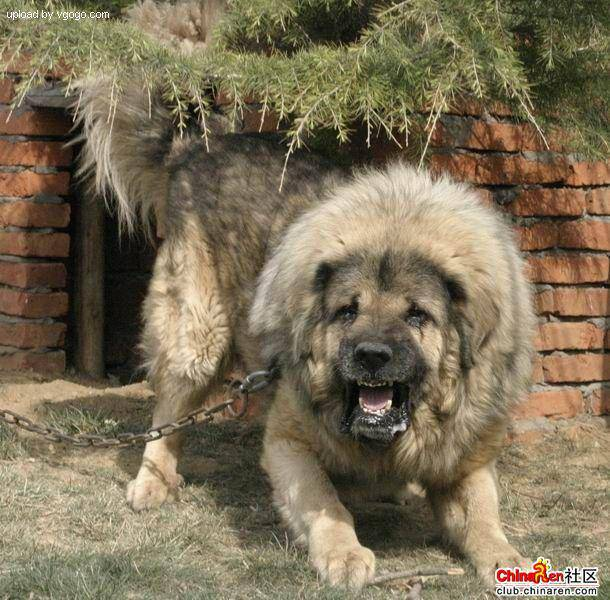

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("No. of labels matches number of filenames.")
else:
  print("No. of labels does not match no. of filenames, check data directory")

No. of labels matches number of filenames.


In [ ]:
# Find the uniques values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a booles array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example : Turning boolean array into Integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0]))  # index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[0].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup x and y variables
x = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set Number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_SIZE
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
x_train[:5], y_train[:5]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

### Preprocessing Images (Turning Images into Tensors)

To preprocess our image into Tensors we're going to write a function which does a few things:
1. Take an Image filepath as an input.
2. Use Tensorflow to read the file and save it to a variable `image`.
4. Normalize our `image` (convert color channel values from 0-255 to 0-1).
3. Turn our `image` (a jpg) into Tensors.
5. Resize the `image` to be a shape of (224,224)
6. Return the modified image.

Before we do, let's see what importing an image looks like.

In [ ]:
# Converting image to Numpy
from matplotlib.pyplot import imread
image=imread(filenames[40])
image.shape

(293, 400, 3)

In [ ]:
# Turn Image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 400, 3), dtype=uint8, numpy=
array([[[255, 247, 250],
        [253, 238, 241],
        [252, 238, 238],
        ...,
        [112, 164,  89],
        [ 99, 151,  79],
        [ 94, 146,  74]],

       [[255, 250, 248],
        [255, 252, 247],
        [255, 247, 242],
        ...,
        [ 96, 148,  74],
        [ 88, 140,  68],
        [ 90, 142,  70]]], dtype=uint8)>

Let's make a fn to preprocess an image

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Load an image
image_path = filenames[45]

# Preprocess the image
processed_image = process_image((x[45]),tf.constant(y))

# Print the shape of the processed image
print(processed_image.shape)


(224, 224, 3)


## Turning our data into batches

Why turn out data into bacthes?

Let's ay you're trying to process 10k+ image in once go... they all might not fit into memory.
So, thats why we do about 32(this is the batch size) image at a time(you can manually adjust the bacth size if need be).
In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which looks like this (image, label).

In [ ]:
# Creating a simple function to return a tuple (image, label)

def get_image_label(image_path,label):
  """
  takes an image file path name and the associated label,
  processes the image and return a tuple of (image,label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(x[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let'smake a function to turn all of our data (`x` & `y`)

In [ ]:
# Define the batch size, 32 is good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also except test data as imput (no label).
  """

# If the data is a test dataset, we probably dont have labels
  if test_data:
    print("Creating Test Data Batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x))  # only filepath (no label)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

# If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),  # filepaths
                                                tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))

    # Shuffling pathnames and labels before mapping image processor funtion is faster than shufflinf image
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    # print("Type of data_batch:", type(data_batch))
    return data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualising Data Batches

Our data is now in batches, however, these can be a little hard to understand/ comprehend, let's visulaize them

In [ ]:
# Create a function for viewing images in a data batch
def show_25_images(images, label):
  """
  Display a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create a subplot (5 rows, 5 cols)
    ax =  plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(labels[i])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

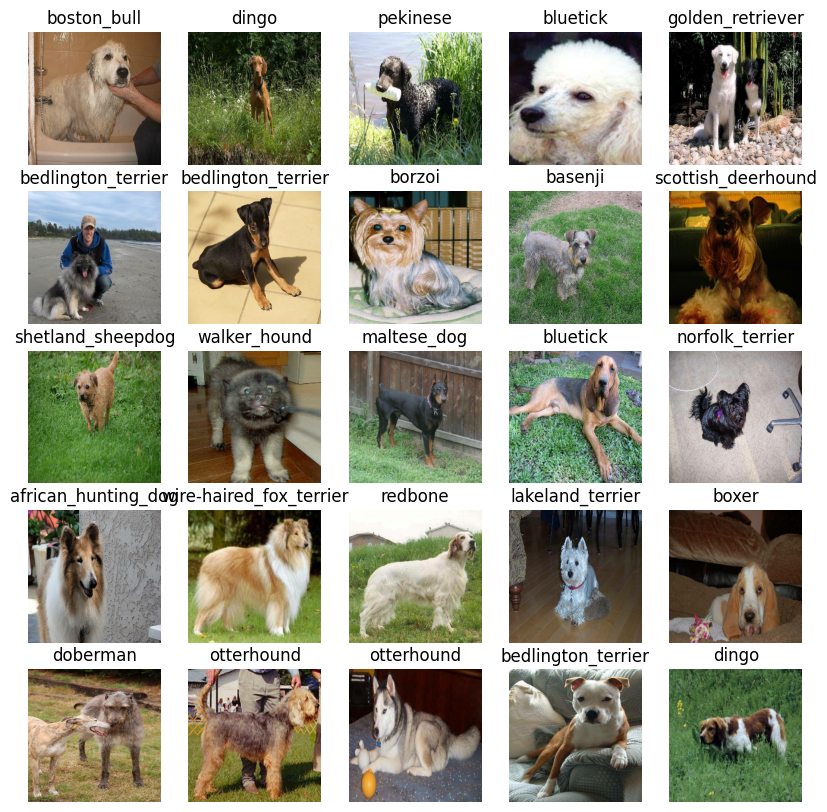

In [ ]:
# Now let's visualise the data in a training batch
import matplotlib.pyplot as plt
show_25_images(train_images,train_labels)

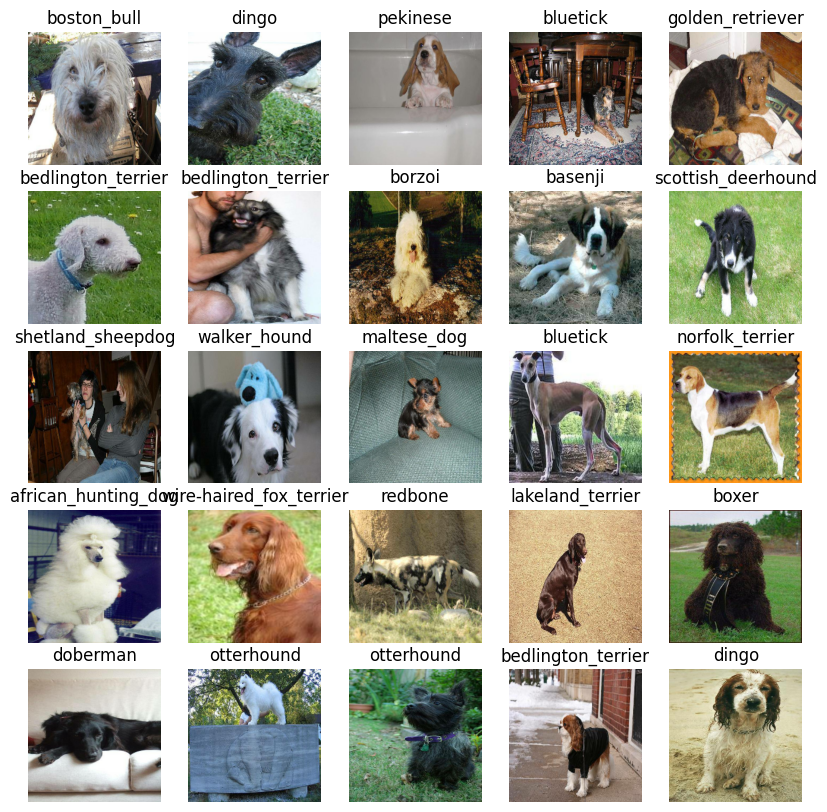

In [ ]:
# Now lets visualise our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a Model
Before we build a model, there are a few things we need to define:

* The input shape (our image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub : "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# Setup Input shape to the model
INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of pur model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras Deep Learning model.

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that)
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model

All these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ",MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),   # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")  # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
model

### Creating Callbacks

Callbacks are helper function a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving


We'll create two callbacks, one for TensorFlow which helps track our models progress and another for eas;y stopping which prevents our model from training for too long.

## TensorBoard
To setup a Tensorboard callbakc, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensoBoard callback which is able to save logs to a directory and pass it to our models fit() function.
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callbaack.
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

In [ ]:
# Create early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

Training a Model (on subset of Data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100, step:10}

In [ ]:
# Checking to make sure we're still running on a GPU
print("GPU","available (YESSS!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!)


Let's create a function which trains a model

* Create a model using `create_model()`
* Setup a TensorBorad callback using
  `using_tensorboard_callback()`
* Call the `fit()` function on our model
  passing it the training data, validation data, number of epochs to train for ('NUM_EPOCHS') and the callbacks we'd like to use
* Return the model

In [ ]:
# Build the function to train and return a trained model
def train_model():
  """
  Train a given model and returns the trained version.
  """

  # Create a Model
  model = create_model()

  # Create new TensorBoard session everytime we train a mode
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 318s 12s/step - loss: 4.4351 - accuracy: 0.1025 - val_loss: 3.2902 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 4s 139ms/step - loss: 1.5837 - accuracy: 0.6925 - val_loss: 2.1144 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 4s 172ms/step - loss: 0.5466 - accuracy: 0.9438 - val_loss: 1.6461 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 5s 211ms/step - loss: 0.2457 - accuracy: 0.9900 - val_loss: 1.4741 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 4s 177ms/step - loss: 0.1442 - accuracy: 0.9975 - val_loss: 1.4285 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 4s 138ms/step - loss: 0.1005 - accuracy: 0.9987 - val_loss: 1.3840 - val_accuracy: 0.6550
Epoch 7/100
25/25 [=============================

Checking the TensorBoard logs

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contens.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

Making and evaluating predictions using a trained model

In [ ]:
# Make predicitons on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 108ms/step


array([[4.7160913e-03, 6.6644177e-05, 5.8102363e-04, ..., 2.8830726e-04,
        1.5373096e-04, 4.7512017e-03],
       [2.8596452e-04, 5.9864753e-05, 4.0151915e-03, ..., 7.9305994e-04,
        2.3589286e-03, 4.2240517e-05],
       [1.5233385e-06, 1.0868246e-05, 4.5868414e-06, ..., 1.8339912e-05,
        7.0603028e-06, 8.5605088e-06],
       ...,
       [3.1726449e-06, 1.8791430e-05, 3.0016365e-05, ..., 5.9573449e-06,
        6.3090440e-05, 2.3308228e-05],
       [2.3741890e-03, 8.8348032e-05, 3.3728586e-05, ..., 7.1193026e-05,
        7.9258811e-05, 6.5822708e-03],
       [5.0310988e-04, 5.7914283e-04, 2.0524270e-03, ..., 8.4161654e-04,
        1.1232962e-03, 8.5495281e-05]], dtype=float32)

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
np.sum(predictions[1])

1.0

In [ ]:
# First Prediction
index=42
print((predictions[index]))
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Prediction label: {unique_breeds[np.argmax(predictions[index])]}")

[2.35381376e-04 2.61186768e-04 2.64230534e-04 1.56295951e-04
 1.33202446e-03 8.04448864e-05 8.68434610e-04 2.25203461e-03
 7.22731650e-03 3.91733460e-02 7.55198344e-05 7.49613264e-06
 7.71984574e-04 2.32602586e-03 3.46279703e-03 5.61012467e-03
 1.90846640e-05 5.38935419e-04 1.00972022e-04 6.12526492e-04
 8.96334459e-05 6.72584691e-04 4.69363840e-05 4.20312354e-05
 1.72978081e-02 8.38903143e-05 1.28325570e-04 9.23268017e-05
 3.98368225e-04 4.36602422e-04 1.37887415e-04 2.99882056e-04
 1.10359273e-04 2.46784130e-05 6.06997710e-05 1.87699334e-04
 3.65928106e-04 3.60182254e-04 1.29575375e-04 3.85779619e-01
 3.44076427e-04 4.54132824e-05 6.81243790e-03 1.84927994e-05
 1.96143650e-04 4.01856560e-05 4.34950052e-04 1.04458572e-03
 1.45344193e-05 3.71169735e-04 3.73079165e-05 1.27464096e-04
 1.58902956e-03 4.21077013e-03 1.39973359e-04 1.02151779e-03
 2.62863352e-04 3.98414595e-05 2.71292811e-04 3.26311601e-05
 3.13089957e-04 1.67902128e-03 4.03737477e-06 1.52014927e-05
 6.40511134e-05 1.285551

Having the aboev functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediciton is being made on!

**Note:** Prediction probabilty are also known as confidence level.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turn an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions tot he validation labels (truth labels)


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batch dataset of (images, label) Tensors and returns separate arrays
  of images and labels
  """
  images = []
  labels = []

  # Loop throgh unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction Labels
* Validation Labels (truth Labels)
* Validation images
Let's make some function to make these labels all a bit more visulaize.

We'll create a function which:
* Takes an array of prediciton probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target images on a single plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth and image for sample n
    """
    pred_prob, truth_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the pred label
    pred_label = get_pred_label(pred_prob)

    # Plot image and remove ticks
    plt.imshow(image)  # Assuming image is of shape (224, 224, 3)
    plt.xticks([])
    plt.yticks([])

    # Change the color to the title depending on if the prediction is right or wrong
    if pred_label == truth_label:
      color="green"
    else:
      color="red"

    # Change plot title to be predicted, probability of prediction and truth label
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                       np.max(pred_prob)*100,
                                       truth_label),
                                       color=color)

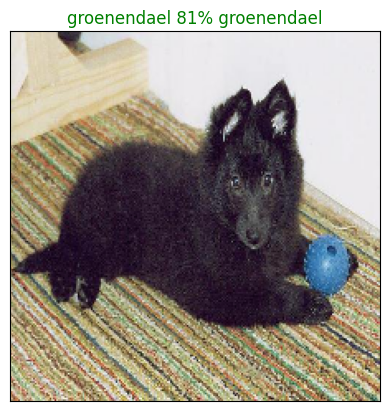

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to viusalize our models top prediciton, let's make another to view our model top 10 predicitons.

This funciton will:
* Take an unout of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
    * Prediction probabilities indexes
    * Prediction probabilities values
    * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

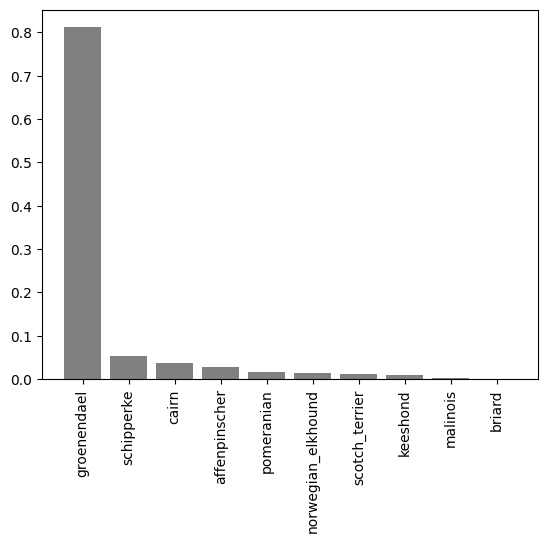

In [ ]:
def plot_pred_conf(predictions, labels, n=1):
  """
  Plus the top 10 highest prediciton confidence along with the truth label for sample n
  """
  pred_prob, truth_label = predictions[n], labels[n]

  # Get the prediction label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediciton confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
            labels=top_10_pred_labels,
            rotation="vertical")

  # Change color of true label
  if np.isin(truth_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == truth_label)].set_color("green")

# Example usage
plot_pred_conf(predictions, labels, n=77)

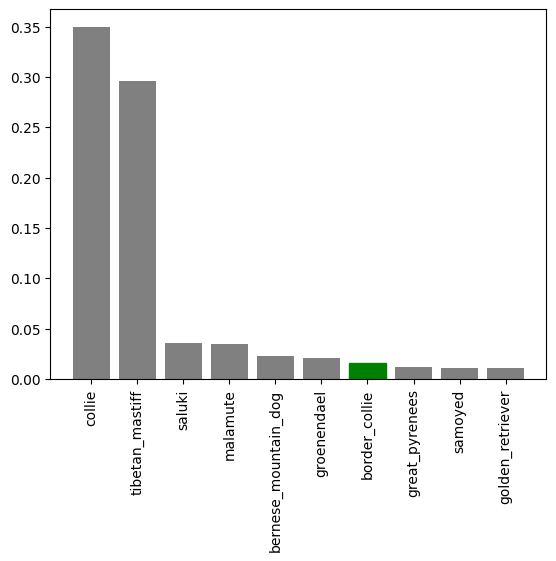

In [ ]:
plot_pred_conf(predictions,
               labels=val_labels,
               n=9)

In [ ]:
predictions[0]

array([1.25032486e-02, 1.38747375e-04, 1.50420330e-03, 1.29876164e-04,
       8.55499602e-05, 1.71689826e-05, 7.35602528e-03, 6.28240872e-03,
       4.44042234e-04, 2.72450328e-04, 9.92722460e-04, 3.62672363e-05,
       8.27312542e-05, 2.13103995e-04, 2.16706609e-03, 1.53874245e-03,
       8.20741334e-05, 2.12158337e-01, 1.01863763e-04, 1.16673720e-04,
       1.13607384e-03, 3.86555505e-04, 6.25130342e-05, 7.16096838e-04,
       5.99489613e-05, 3.22024396e-04, 1.08090073e-01, 2.69609183e-04,
       5.94961341e-04, 9.40138183e-04, 1.82613749e-05, 3.93975480e-03,
       2.03283690e-03, 4.98158806e-05, 4.77109337e-04, 3.72883826e-02,
       3.95718016e-05, 1.12810558e-04, 7.19036674e-04, 4.15579561e-05,
       3.45223024e-03, 5.12206607e-05, 4.65738296e-04, 4.71405132e-04,
       1.62432098e-05, 5.72101890e-05, 4.27495106e-05, 3.80950660e-04,
       7.53011671e-04, 9.65523723e-05, 7.30819302e-05, 1.05624335e-04,
       2.29529222e-04, 1.29378721e-04, 1.65658072e-04, 9.27606598e-05,
      

Now we've got some function to help us visualize our prediction and evaluate our model, let's check out a fet.

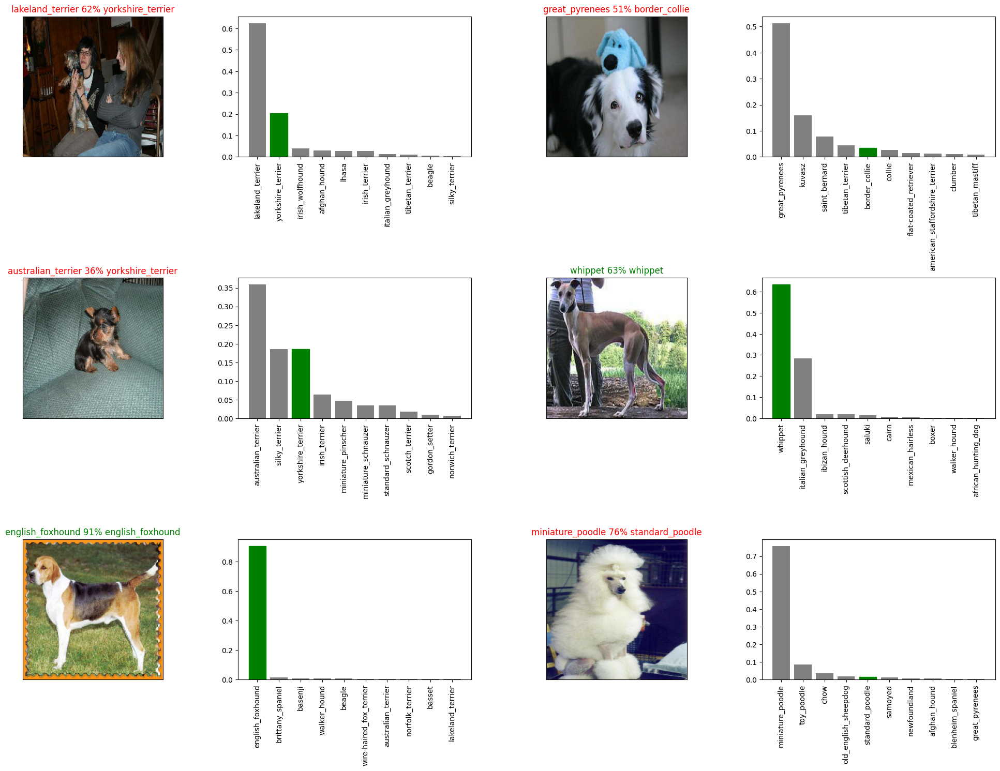

In [ ]:
import matplotlib.pyplot as plt

# Let's check out a few predictions and their different values

i_multiplier=10
num_rows=3
num_cols=2
num_images= num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()


##Saving and Reloading a trained model

In [ ]:
# Create a fucniton to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """

  # Create a model directory pathname with current time
  modeldir=os.path.join("drive/MyDrive/Dog Vision/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "_" + suffix + ".h5"  #Show format of model

  print(f"Saving model to: (model_path)...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got function to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: (model_path)...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240516-18231715883838_1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_images_model = load_model('drive/MyDrive/Dog Vision/models/20240514-18581715713109_1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20240514-18581715713109_1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 97ms/step - loss: 1.3080 - accuracy: 0.6800


[1.307966709136963, 0.6800000071525574]

In [ ]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.1673 - accuracy: 0.6950


[1.1673365831375122, 0.6949999928474426]

## Training a big dog model (on the full data)

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(x,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

** Note** : Running the cell below will take a little while (mayby upto 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the model to the full data
full_model.fit(x=full_data,
              epochs=NUM_EPOCHS,
              callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 46s 133ms/step - loss: 1.3503 - accuracy: 0.6709
Epoch 2/100
320/320 [==============================] - 41s 129ms/step - loss: 0.4017 - accuracy: 0.8817
Epoch 3/100
320/320 [==============================] - 47s 145ms/step - loss: 0.2391 - accuracy: 0.9349
Epoch 4/100
320/320 [==============================] - 44s 136ms/step - loss: 0.1574 - accuracy: 0.9607
Epoch 5/100
320/320 [==============================] - 42s 131ms/step - loss: 0.1065 - accuracy: 0.9787
Epoch 6/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0769 - accuracy: 0.9863
Epoch 7/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0583 - accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0461 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0365 - accuracy: 0.9970
Epoch 10/100
320/320 [==============================] - 40s 125m

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: (model_path)...


'drive/MyDrive/Dog Vision/models/20240516-18241715883849_full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20240514-19531715716434_full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20240514-19531715716434_full-image-set-mobilenetv2-Adam.h5


## Making prediction on the test dataset

Since out model has been trained on images in the form of Tensor Batches, to make predicitons on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor Batchs.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predicitons array by passing the test batches to the `predic()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e4cffb02169d9b46810d50c6b9eae28d.jpg',
 'drive/MyDrive/Dog Vision/test/dd8d95720349f85d2a795adaafc71172.jpg',
 'drive/MyDrive/Dog Vision/test/e52a4321a8cb0dd3bcc8f4a68b75eee7.jpg',
 'drive/MyDrive/Dog Vision/test/e2a6dfb8127f801af0626f245f35441e.jpg',
 'drive/MyDrive/Dog Vision/test/e0806e5049519130d459dd7bd640a092.jpg',
 'drive/MyDrive/Dog Vision/test/dcb6ce994241db517c1ebe42897db826.jpg',
 'drive/MyDrive/Dog Vision/test/e57a2bee790b512b2ba824b26f3f93fd.jpg',
 'drive/MyDrive/Dog Vision/test/e35bb9ec7ff4410f0fb097569af4e66a.jpg',
 'drive/MyDrive/Dog Vision/test/e00e5f7f822fd670bba314f87cce8428.jpg',
 'drive/MyDrive/Dog Vision/test/dd2228d2fbb3ddc8fb350106c2d989ef.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating Test Data Batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data becth will take a long time to run( about 1 hr)

In [ ]:
# Make prediction on test data batch using the loaded full model
test_prediction = loaded_full_model.predict(test_data,
                                            verbose=1)

324/324 [==============================] - 42s 129ms/step


In [ ]:
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_prediction, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predcition = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv",delimiter=",")

In [ ]:
test_predcition[:10]

array([[3.50587045e-13, 2.10349932e-11, 4.66140739e-15, ...,
        2.05839512e-12, 1.29717656e-12, 2.90070507e-12],
       [3.73482507e-08, 2.25933354e-06, 2.39467300e-12, ...,
        4.64260661e-12, 2.24844179e-08, 6.13348391e-07],
       [1.38894777e-07, 2.15295240e-05, 7.82022613e-10, ...,
        1.31731431e-10, 6.22742302e-10, 1.14752938e-11],
       ...,
       [2.44210641e-12, 3.88772659e-09, 8.26460150e-11, ...,
        3.13218534e-10, 2.42211172e-13, 7.90064902e-08],
       [2.08477846e-10, 5.21247837e-11, 1.47416957e-11, ...,
        8.56388516e-10, 3.47781829e-12, 9.22595500e-10],
       [3.12106536e-08, 3.77204899e-11, 2.90182522e-09, ...,
        5.10087217e-09, 3.70389053e-08, 1.29678192e-05]])

In [ ]:
test_predcition.shape

(10357, 120)

## Prediction test dataset predictions for Kaggle

In [ ]:
## Create a Pandas Dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
## Append test image ID's to predict DataFrams
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e4cffb02169d9b46810d50c6b9eae28d, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"(dd8d95720349f85d2a795adaafc71172, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"(e52a4321a8cb0dd3bcc8f4a68b75eee7, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"(e2a6dfb8127f801af0626f245f35441e, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"(e0806e5049519130d459dd7bd640a092, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
## Add the prediction probabilities to each dog breed columm
preds_df[list(unique_breeds)] = test_prediction
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e4cffb02169d9b46810d50c6b9eae28d, .jpg)",3.505870e-13,2.103499e-11,4.661407e-15,1.026306e-11,1.546090e-15,1.636477e-15,1.537170e-14,7.587480e-16,1.513039e-13,...,2.367756e-09,2.430928e-14,1.397039e-12,1.231647e-11,5.105552e-15,2.672065e-13,3.775508e-14,2.058395e-12,1.297177e-12,2.900705e-12
1,"(dd8d95720349f85d2a795adaafc71172, .jpg)",3.734825e-08,2.259334e-06,2.394673e-12,7.442497e-14,1.837907e-11,3.626483e-11,1.822786e-08,9.554921e-09,1.170645e-10,...,1.151028e-07,4.903434e-10,1.522431e-09,6.270482e-12,4.703523e-10,4.769851e-11,3.088730e-07,4.642607e-12,2.248442e-08,6.133484e-07
2,"(e52a4321a8cb0dd3bcc8f4a68b75eee7, .jpg)",1.388948e-07,2.152952e-05,7.820226e-10,1.688384e-09,1.639400e-09,9.138992e-09,1.746548e-08,4.353838e-11,5.444219e-09,...,8.286868e-10,1.511744e-09,4.328608e-11,1.970845e-08,3.217465e-08,1.587979e-13,2.248177e-11,1.317314e-10,6.227423e-10,1.147529e-11
3,"(e2a6dfb8127f801af0626f245f35441e, .jpg)",1.577394e-08,8.643835e-05,1.011769e-09,1.858260e-05,1.709664e-06,7.572703e-08,1.557721e-06,3.382890e-03,9.322760e-08,...,2.067105e-06,9.946056e-06,2.753206e-07,1.367307e-04,9.035986e-05,5.514973e-04,7.772329e-04,4.513628e-07,1.943121e-01,2.737576e-05
4,"(e0806e5049519130d459dd7bd640a092, .jpg)",2.947224e-12,5.998113e-15,4.857358e-10,2.184154e-12,9.948237e-01,1.256280e-08,1.274670e-08,7.708404e-07,4.662492e-13,...,2.539896e-08,3.803835e-08,3.437459e-10,2.091716e-09,4.357614e-10,2.125480e-12,1.557153e-09,1.586247e-07,3.877054e-08,1.457206e-10


In [ ]:
# Save the predictions dataframe to csv for submission to kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)

## Making prediction on custom images
To make prediction on custom images, we'll:
* get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` paraameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the prediction labels to the custom images.


In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/rottweiler.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/germens.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating Test Data Batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['rottweiler', 'german_shepherd']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't label... maybe we could fix this later)
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

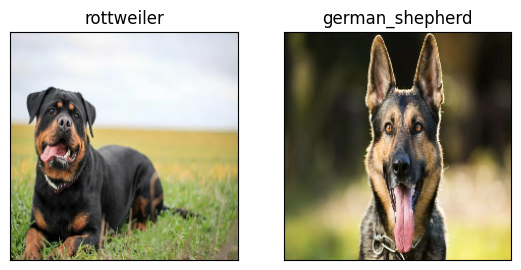

In [ ]:
# Check custom image predicitons
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)